<hr style="border:2px solid black"> </hr>

# <center><font size="7">Nootropics</font></center>

<center><font size="4">Welcome to the wonderful world of nootropics, where no task is ever too demanding!</font></center>

<hr style="border:2px solid black"> </hr>

# A. How to use this notebook

This notebook is a part of a [project (TODO: MAKE SURE LINK WORKS)](https://XXXXXXXXXXXX). To gain access to all the functionality, download the project and run the notebook from the project root.

## A.1 The code

The code presented in this notebook has been boiled down to as few function calls as possible to make it easy for the reader to play with the parameters we have been tweaking during data collection and analysis. 

The all the underlying code written by the the authors of this notebook has been organized in two packages residing in the project root:

* `library_functions`
* `wojciech`

The project also requires following external packages:

```
plotly, version 4.12.0
pandas, version 1.1.1
spacy, version 2.3.2
infomap, version 1.2.1
regex, version 2020.7.14
ipywidgets, version 7.5.1
tqdm, version 4.50.0
python_louvain, version 0.14
wikipedia, version 1.4.0
textblob, version 0.15.3
fa2, version 0.3.5
numpy, version 1.19.2
wordcloud, version 1.8.0
networkx, version 2.5
matplotlib, version 3.3.2
powerlaw, version 1.4.6
beautifulsoup4, version 4.9.3
community, version 1.0.0b1
ipython, version 7.19.0
mediawiki, version 0.0.1
project, version 20
psaw, version 0.0.12
```

Additionally, we will need the `en_core_web_sm` language module  for the `spaCy` package. It can downloaded by running the cell:

In [1]:
# !python -m spacy download en_core_web_sm

## A.2 The data [UPDATE!]


 The cleaned data is placed in the folder:

 `shared_data`

# B. Initialization

All necessary imports and definitions can be effectuated by running the cell:

In [5]:
from library_functions.initialize_explainer_notebook import *

<hr style="border:2px solid black"> </hr>

# 1. Motivation

* What is your dataset?
* Why did you choose this/these particular dataset(s)?
* What was your goal for the end user's experience?

<hr style="border:2px solid black"> </hr>

# 2. Basic stats

There were five main parts in obtaining and preparing our data:

1. Obtaining a list of the WikiPedia pages we want to use
2. Downloading those pages and extracting links between them
3. Downloading all reddit posts from [r/nootropics](https://www.reddit.com/r/Nootropics/)
4. Finding mentions of nootropics in those posts
5. Assigning sentiments to Reddit Posts

## 2.1 Data Collection and Cleaning

### 2.1.1 WikiPedia: Choosing which pages to download

To start off, we needed to choose which WikiPedia data to use. Initially, we took all the pages that were below the category [Drugs by psychological effects](https://en.wikipedia.org/wiki/Category:Drugs_by_psychological_effects), and manually removed irrelevant pages and sub-categories. We mainly removed:

- Everything under categories that cannot realistically be considered nootropics, such as [Psychedelic Drugs](https://en.wikipedia.org/wiki/Category:Psychedelic_drugs)
- Pages and categories that were not about specific substances - such as [Songs about Tobacco](https://en.wikipedia.org/wiki/Category:Songs_about_tobacco)
- Pages about __types__ of substances - such as [Stimulant](https://en.wikipedia.org/wiki/Stimulant). We only want to include substances - not *types of substances*.

This part was very tedious and manual, and there was really nothing interesting about it - so we won't include code here. If you are interested, notes are in [TODO - LINK NOTEBOOK], You can also look at the resulting category tree [here](https://github.com/wojciechdk/Social_Graphs_and_Interactions_Final_Project/blob/master/shared_data/full_category_tree_clean.json).

### 2.1.2 WikiPedia: Downloading the pages and extracting links

Now that we had our list of pages, we needed to actually download them. This was more challenging than expected, and resulted in a couple of pull requests to the python library we are using. We won't go into details here are it is mostly irrelevant for our later analysis, but you're invited to look in [TODO-add link] for more information.

Briefly, that notebook does three things:

1. Traverse the category tree we generated before
2. Download each page and save it to file
3. Extract links (the hard part to get right)

The result is a large amount of files (~1500) with the contents of all the pages (which are not included in our repo to save space), as well as one large file containing the resulting data in a more convenient form - which you can find [here](https://github.com/wojciechdk/Social_Graphs_and_Interactions_Final_Project/blob/master/shared_data/full_wiki_data.json).

### 2.1.3 Reddit: Downloading Posts

For Reddit posts, we make use of the [Pushift Python Library](https://github.com/pushshift/api), which is an interface to the [Pushift.io](https://api.pushshift.io/). This library is very powerful and easy to use, which meant that downloading over a 100.000 posts took much less effor than the 1.500 pages on wikipedia. Once more, the details aren't really relevant to this course - so we won't show them here, but feel free to look at [TODO - insert link].

## 2.2 Data preprocessing [Luca & Wojciech]

* Detection of matches in content,
* Sentiment analysis with TextBlob

## 2.3 Data statistics

* Wiki: number of pages,
* Reddit: number of posts,
* Data size in bytes.
* Histograms: matches per post, reddit post length, etc..

<hr style="border:2px solid black"> </hr>

# 3. Tools, theory and analysis.

Analyzing the data can be greatly simplified width adequate tools. The better the tools, the more aspects of the data can be  seen and interpreted, creating a stronger fundament for eventual conclusions. 

Given the limited time scope for this project, we have focused on two tings:

1. Development of toolboxes that will allow the user to zoom into the aspects of our networks which we have found interesting. 
2. Development of a user-friendly website that will use these toolboxes to manipulate and visualize the data.

The toolboxes were attempted created in a way that would allow the user to easily alter a set of preselected parameters and see the effects of the applied changes in a clear and comprehensive manner. We are hoping that this approach will make it easier for us to further explore the data in the future, and will provide the user usefull tools for exploring this and other datasets.

**LUCA'S ADDIDTION HERE**

In the following subchapters, we explain the process of:

* __Graph creation__: where we describe how we have created the networks and how they can be altered using the tools we have created.

* __Network analysis__: where we present and evaluate the properties of the created networks obtained using our toolbox.

* __Community detection and categorization__: where we describe and visualise the communities we have discovered in the created network and their relationship to each other.

* __Text analysis: wordclouds, sentiments, and more__: where we describe how we have dealt with the texz and created visualizations of the language used in different situations.


## 3.2 Graph creation

We will be modelling the Wikipedia graph as a directional graph, and the Reddit graph as an undirectional graph. For easier comparison of the graphs we have decided to use the __names of substances regarded as nootropics on Wikipedia__ as nodes for both the Wikipedia and the Reddit network.

### 3.2.1 Wikipedia

#### 3.2.1.1 Nodes

The nodes in the Wikipedia network have the following attributes:

* `categories`: a list of categories to which the substance belongs on Wikipedia, e.g. `stimulant`.

* `content`: the clean content of the substance's Wikipedia page.

* `url`: the url of the substance's Wikipedia page.

#### 3.1.1.2 Edges

An edge in the Wikipedia network is created when there is a link from a Wikipedia page of one nootropic substance to another.

The edges in the Wikipedia network have the following attributes:

* `count`: Number of occurrences of the edge (sometimes a link appears multiple times in the same page).

#### 3.1.1.3 Code for graph creation

To create the Wikipedia graph, run the cell:

In [6]:
g_wiki = lf.create_graph_wiki()

### 3.2.2 Reddit

#### 3.2.2.1 Nodes

We have already mentioned that we have chosen that nodes of the Reddit graph be the same as the nodes of the Wikipedia graph. Their attributes, however, are different:

* `categories`: a list of categories to which the substance belongs on Wikipedia, e.g. `stimulant`.

* `count`: The number of Reddit posts in which the substance is mentioned.

* `polarity`: a list where each element represents a measure of positivity of sentiment of a post in which the substance is mentioned. The polarity ranges from -1 to 1, where -1 represents a completely negative sentiment, and +1 completely positive sentiment.

* `subjectivity`: a list where each element represents a measure of subjectivity of a post in which the substance is mentioned. The subjectivity ranges from 0 to 1, where 0 represents a completely factual post, and 1 completely subjective opinion.

* `content` (optional): a list where each element represents contents (text) of a post in which the substance is mentioned.

#### 3.2.2.2 Edges

An edge in the Reddit network is created when two nootropic substances are mentioned in the same Reddit post.

The edges of the Reddit network have following attributes:

* `count`: The number of Reddit posts in which the linked substances are mentioned.

* `number_of_drugs_in_post`: a lit where each element represents the number of substances mentioned in the Reddit post in which the linked substances occur.

* `polarity`: a list where each element represents a measure of positivity of sentiment of a post in which the substance is mentioned. The polarity ranges from -1 to 1, where -1 represents a completely negative sentiment, and +1 completely positive sentiment.

* `subjectivity`: a list where each element represents a measure of subjectivity of a post in which the substance is mentioned. The subjectivity ranges from 0 to 1, where 0 represents a completely factual post, and 1 completely subjective opinion.

* `content` (optional): a list where each element represents contents (text) of a post in which the substance is mentioned.

#### 3.2.2.3 Tweakable parameters

The graph is created using the function `lf.create_graph_reddit`. In the input of this function, the user can specify a number of constraints that will affect the creation of the graph. The tweakable parameters are:

* `max_drugs_in_post`: a maximum accepted drugs in a post. The Reddit posts containing more drugs will be disregarded. This parameter can be used to filter out posts containing entire lists of drugs, and thus do not reveal much useful information about a possible connection between specific substances.

* `min_edge_occurrences_to_link`: a limit describing the minimum number times a link needs to appear in order to be considered valid. The links that occur less times will be disregarded. This parameter can be used to filter out seldom occurring links.

* `min_content_length_in_characters`: a limit describing the minimum allowabgle length of the content of the Reddit post. Posts with shorter content will be disregarded. This parameter can be used to filter out posts with very short content.

* `conditional_functions_dict`: a dictionary keyed by attribute names whose values are functions that represent conditions for those attributes, e.g.:

 ```
 conditions = {'polarity': lambda x: x > 0.1,
                'subjectivity': lambda x: < 0.2}
 ```
 
 This parameter can be used to create a graph based on the values of a certain attribute, or a combination of attributes, e.g. a graph of substances connected in posts with a positive sentiment.

* `include_node_contents`: A boolean determining whether to assign the content of the posts containing a drug as a node attribute. This parameter can be used to reduce the amount of data stored in RAM and shorten up the processing time.

* `include_link_contents`: A boolean determining whether to assign the content of the posts containing a drug as a edge attribute. This parameter can be used to reduce the amount of data stored in RAM and shorten up the processing time

#### 3.2.2.3 Effect of tweakable parameters on the Reddit graph

In this section we will present the reasoning behind our choice of values for the parameters that affect the formation of the Reddit graph. To do this we will compare four Reddit graphs created using the constraints we will be using in the remainder of the project:

* A raw graph, created with no constraints.
* A graph where Reddit posts with more than 10 substances were discarded.
* A graph where Reddit posts whose content was less than 25 characters log where discarded.
* A graph where all the links appearing less then 2 times were removed.

The graphs are created by running the cell:

In [4]:
# Create test Reddit graphs.
test_reddit_graphs = dict()

test_reddit_graphs['Raw'] = lf.create_graph_reddit()

test_reddit_graphs['Max 10 drugs in post'] = \
    lf.create_graph_reddit(max_drugs_in_post=10)

test_reddit_graphs['Min 25 characters in post'] = \
    lf.create_graph_reddit(min_content_length_in_characters=25)

test_reddit_graphs['Min 3 occurences to link'] = \
    lf.create_graph_reddit(min_edge_occurrences_to_link=3)

Let's first take a look at the distribution of the edge attribute: __*polarity_weighted*__, which is a one-digit representation of the positivity of the sentiment of all posts in which the edge exists.

We can plot the comparison of the networks created using different parameters by running the cell:

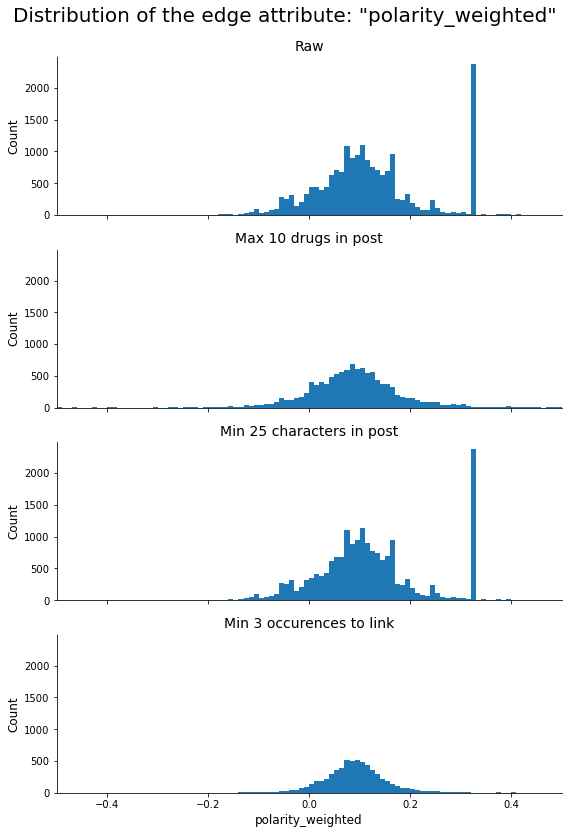

In [5]:
# Plot the distribution of the edge parameter: "polarity_weighted"
axess = w.graph.plot_comparison_of_attribute_distributions(
    test_reddit_graphs,
    attribute_name="polarity_weighted",
    attribute_parent="edge",
    as_probability_distribution=False,
    bins=np.linspace(-1, 1, 201),
    x_limit=(-0.5, 0.5),
    fig_width=8
)

We can see in the figure above that the raw graph (top plot) contains a remarkably high number of edges with weighted polarity value of around 3.5. An investigation showed that this has been caused by a small fracture of posts containing long lists of substances, often for commercial purposes. Without any constraints, we would create a link between all the substances present in such a post. We are, however, more interested in the links between substances that the Reddit users discuss rather than posts that serve as advertisements. Therefore, we have decided to impose a limit of max 10 substantes per post that will be included in our graph (second plot from top).

We have also chosen to disregard the very weak links i.e. links that appear less then 3 times, in order to reduce the amound of "noise" in the created graph (bottom plot). 

To understand why we have chosen to disregard the Reddit posts whose content was less than 25 characters long, let's look at the distrbution of the polarity values for a popular nootropic substance: caffeine:

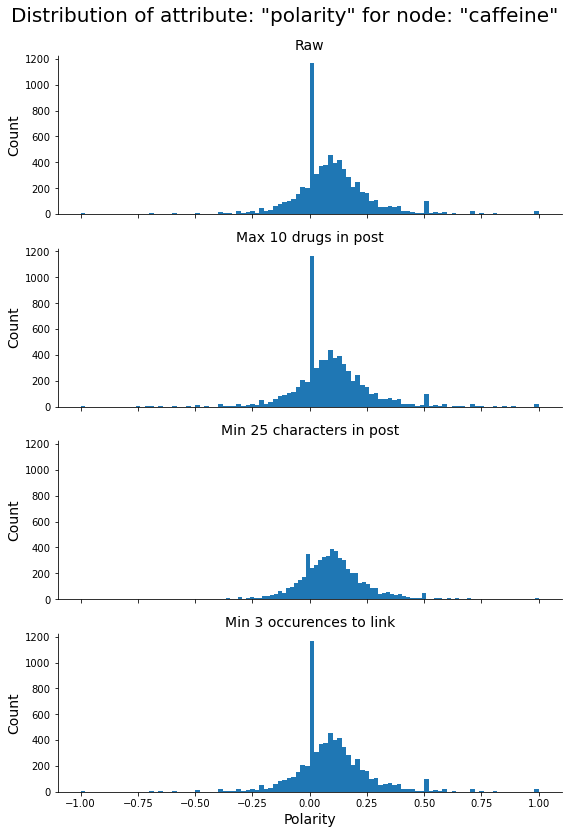

In [6]:
# Plot distribution of values of one instance (node or edge)
axess = w.graph.plot_distribution_of_attribute_of_1_instance(
    test_reddit_graphs,
    instance="node",
    instance_label="caffeine",
    attribute_name="polarity",
    fig_width=8
)

We can see in the figure above that the raw graph contains exceptionally many posts which mention caffeine with a polarity of 0. An investigation of this phenomenon revealed that the word "caffeine" was mentioned in the title of a removed post, whose content therefore consisted of a single string: `[removed]`. As such posts provide with with little to none information about the context of a potential link, we have chosen to disregard posts with less than 25 characters.

#### 3.2.2.4 Code for graph creation

To create the Reddit graph with our choice of constraints, run the following code:

In [7]:
g_reddit = lf.create_graph_reddit(
    max_drugs_in_post=10,
    min_edge_occurrences_to_link=3,
    min_content_length_in_characters=25,
    conditional_functions_dict=None,
    include_node_contents=False,
    include_link_contents=False,
    show_progress_bars=False
)

We also invite the reader to create an alternative graph using their own constraints. We will include this graph in our analysis in the following chapters:

In [8]:
g_reddit_reader = lf.create_graph_reddit(
    max_drugs_in_post=10,
    min_edge_occurrences_to_link=3,
    min_content_length_in_characters=25,
    conditional_functions_dict={'polarity': lambda x: x > 0.15},
    include_node_contents=False,
    include_link_contents=False,
    show_progress_bars=False
)

## 3.3 Network analysis

In this chapter we will zoom in on specific properties of the created networks, compare them, and interpret our findings.

Let's start by organizing the graphs we will be comparing in a dictionary:

In [9]:
# List the graphs that will be used in further analysis.
graphs = {'Wikipedia': g_wiki,
          'Reddit': g_reddit,
          'Reddit (reader)': g_reddit_reader}

### 3.X.X Size of networks

The size of can be displayed by running the cell:

In [10]:
lf.display_graph_size(graphs)

,Nodes,Edges
Wikipedia,1496,3870
Reddit,1496,4197
Reddit (reader),1496,1659


It is our choice that the nodes in the Reddit network be the same as in the Wikipedia network, so the number of nodes will be the same in all networks. When it comes to the number of edges, the Reddit and Wikipedia networks are also very similar (3870 vs. 4179). Please note that this is coincidental and not something we have been aiming for.

### 3.X.X Basic degree statistics

In [18]:
# Display the basic degree statistics.
for graph_name, graph in graphs.items():
    printmd(f'Degree statistiscs for the **{graph_name}** network:')
    degree_stats_reddit = w.graph.degree_statistics(graph,
                                                    as_pandas=True,
                                                    printout=True)
    print()   

Degree statistiscs for the **Wikipedia** network:

,Min,Max,Mean,Median,Mode
Total degree,0,110,5.174,2.000,0
In-degree,0,85,2.587,1.000,0
Out-degree,0,40,2.587,1.000,0


Degree statistiscs for the **Reddit** network:

,Min,Max,Mean,Median,Mode
Total degree,0,198,5.611,0.000,0


Degree statistiscs for the **Reddit (reader)** network:

,Min,Max,Mean,Median,Mode
Total degree,0,102,2.218,0.000,0


It can be seen in the tables above that the most frequent degree of a node in both the Wikipedia and Reddit networks is zero, i.e. many nodes are isolated. The median in the case of the Reddit graph is also 0, while median for the Wikipedia network is 2. In both networks we can find hubs, i.e. nodes whose degree is much larger than the avereage. The most connected node in the Reddit network has a degree of 198, and in the Wikipedia network 110.

Now, let's dig a bit deeper and take a look at the degree distributions of the networks.

### 3.3.1 Degree distribution

We can compare the degree distributions of our networks by running the cell:

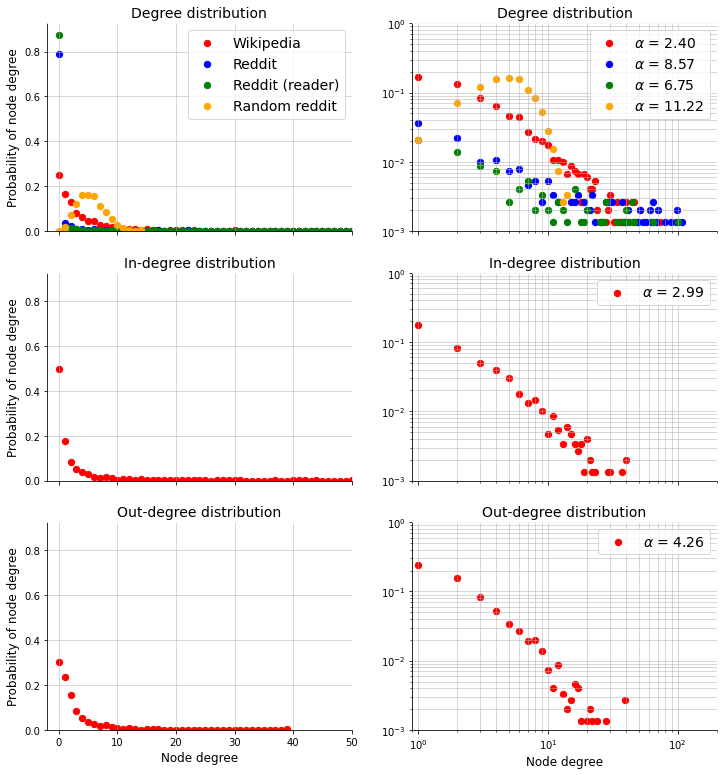

In [13]:
# Create a random network with the same degree probability as the g_reddit network.
random_like_g_reddit = w.graph.erdos_renyi_like(g_reddit)

# Add the created random network to the collection of graphs to analyze.
graphs_to_analyze = graphs.copy()
graphs_to_analyze.update({'Random reddit': random_like_g_reddit})

# Define the colors by which the graphs will be represented in the analysis.
graph_colors = ["red", "blue", "green", "orange"]

# Plot the comparison of the degree distribution.
all_axes = w.graph.plot_degree_distribution_summary(
    graphs_to_analyze,
    graph_colors=graph_colors,
    x_lim_lin=(-2, 50),
    x_lim_log=(0.9, 200)
)

We can see in the figure above that almost 80 % of all the nodes in the Reddit network are isolated, meaning that the users of Reddit don't mention them together with other substances or don't mention them at all. It is also apparent that the Wikipedia and the Reddit networks have highly connected nodes, and that their degree distributions follow a power law, differing significantly from the degree distribution of a random network with similar link probability. It is, however, only the Wikipedia network that exhibits the scale-free property with $\alpha$ just under 3.

### 3.3.2 Most central nodes

In this chapter we will discover the most central nodes in our networks. Let's start by defining some parameters about how we we want our results presented:

In [15]:
# Define the number of nodes to show in the result tables.
n_results = 5

# Specify the precision for the digits in the result tables
precision_in_decimals = 3 

# Apply the table precision setting
pd.options.display.float_format = f"{{:,.{precision_in_decimals}f}}".format

Now, we can get the information about the most central nodes by running the cell:

In [16]:
# Show the most central nodes.
for graph_name, graph in graphs.items():
    printmd(f'The most central nodes in the **{graph_name}** network:')
    most_central_nodes_wiki = w.graph.most_central_nodes(
        graph, n=n_results, as_pandas=True, printout=True)
    print()

The most central nodes in the **Wikipedia** network:

Degree              In-degree        Out-degree        \
              Drug Score             Drug Score        Drug Score   
1      amphetamine   110          cocaine    85      rti-56    40   
2          cocaine   103      amphetamine    83     rti-331    40   
3          tobacco    74             mdma    56     rti-332    40   
4  methamphetamine    73  methamphetamine    52     rti-333    40   
5             mdma    73          tobacco    50  sertraline    28   

       Betweenness            Eigenvector        
              Drug Score             Drug Score  
1          cocaine 0.038       fluoxetine 0.241  
2  methamphetamine 0.032      amphetamine 0.234  
3      amphetamine 0.031       imipramine 0.211  
4             mdma 0.026       sertraline 0.189  
5         nicotine 0.025  methamphetamine 0.181

The most central nodes in the **Reddit** network:

Degree                  Betweenness        \
                    Drug Score                   Drug Score   
1  s-adenosyl methionine   198  s-adenosyl methionine 0.009   
2               caffeine   172               caffeine 0.005   
3               theanine   159                    tea 0.003   
4                 coffee   143               theanine 0.002   
5                choline   134                 coffee 0.002   

             Eigenvector        
                    Drug Score  
1  s-adenosyl methionine 0.158  
2               caffeine 0.154  
3               theanine 0.153  
4                 coffee 0.147  
5                choline 0.147

The most central nodes in the **Reddit (reader)** network:

Degree                  Betweenness  \
                                         Drug Score                   Drug   
1                                    caffeine   102               caffeine   
2                                    theanine   102  s-adenosyl methionine   
3                       s-adenosyl methionine    99               theanine   
4                                     choline    81                choline   
5  n-phenylacetyl-l-prolylglycine ethyl ester    79              modafinil   

                                        Eigenvector        
  Score                                        Drug Score  
1 0.002                                    caffeine 0.199  
2 0.002                                    theanine 0.198  
3 0.002                       s-adenosyl methionine 0.194  
4 0.001                                     choline 0.184  
5 0.001  n-phenylacetyl-l-prolylglycine ethyl ester 0.182

**INTERPRETATION HERE**

### 3.3.3 Most frequent edges

In this chapter we will discover the most often occurring links betweeen substances. They can be viewed by running the  cell:

In [15]:
most_common_edges = lf.most_frequent_edges(
    graphs, n=5, as_pandas=True, printout=True)

Wikipedia        \
                                         Edge Count   
1            (dextroamphetamine, amphetamine)    10   
2                (muscimol, amanita muscaria)    10   
3                     (adderall, amphetamine)     9   
4  (testosterone (patch), methyltestosterone)     9   
5          (hypericum perforatum, hyperforin)     8   

                              Reddit                          Reddit (reader)  \
                                Edge Count                               Edge   
1               (caffeine, theanine)  2259               (caffeine, theanine)   
2                 (caffeine, coffee)  1372                 (caffeine, coffee)   
3                 (theanine, coffee)   922                 (theanine, coffee)   
4  (caffeine, s-adenosyl methionine)   787              (citicoline, choline)   
5              (citicoline, choline)   638  (caffeine, s-adenosyl methionine)   

         
  Count  
1   778  
2   371  
3   261  
4   199  
5   181

## 3.4 Community Detection and Categorization

One of the things we were curious about as we started this project was whether community-detection algorithms would be able to pick up communities that correspond to actual, known, categorizations of our nodes.

The results of our exploration can be found in an interactive form on our website, [TODO] so instead of repeating everything here, we'll simply describe our attempts at community detection, the problems we encountered, and what we ended up using.

Before we start, let's load in our networks - note that for this part, we only look at the undirected version of the WikiPedia network, and we look only at the Largest Connected Component.

In [16]:
gcc_wiki = w.graph.largest_connected_component(g_wiki.to_undirected())
gcc_reddit = w.graph.largest_connected_component(g_reddit)

### 3.4.Z Laying out the networks: ForceAtlas 2 all over again

To be able to visualize any communities we might find, we first needed to compute a good layout for our graph. We instantiated the algorithm with the following parameters:

In [17]:
forceatlas2 = ForceAtlas2(
    # Behavior alternatives
    outboundAttractionDistribution=True,  # Dissuade hubs
    edgeWeightInfluence=1.0,
    # Performance
    jitterTolerance=0.5,  # Tolerance
    barnesHutOptimize=True,
    barnesHutTheta=1.2,
    # Tuning
    scalingRatio=5,
    strongGravityMode=False,
    gravity=1,
    # Log
    verbose=True,
)

For the wikipedia network, this worked pretty well out of the box.

As an aside, note that the network visualizations in this section are interactive - we implemented some functions that allow us to visualize a graph with [Plotly](https://plotly.com), and to get information about nodes when hovering them.

In [18]:
positions_wiki = lf.get_fa2_layout(graph=gcc_wiki)
wiki_graph_plot = lf.draw_graph_plotly(
    graph=gcc_wiki,
    positions=positions_wiki,
    node_size_attribute="degree",  # Size nodes by degree
)
wiki_graph_plot

100%|██████████| 1000/1000 [00:21<00:00, 47.02it/s]


BarnesHut Approximation  took  4.71  seconds
Repulsion forces  took  15.47  seconds
Gravitational forces  took  0.13  seconds
Attraction forces  took  0.06  seconds
AdjustSpeedAndApplyForces step  took  0.40  seconds


For the Reddit graph, however, the results were underwhelming:

In [19]:
positions_reddit = lf.get_fa2_layout(graph=gcc_reddit)
reddit_graph_plot = lf.draw_graph_plotly(
    graph=gcc_reddit,
    positions=positions_reddit,
    node_size_attribute="degree",  # Size nodes by degree
    edge_weight_attribute="count" # Size edges by how oftenS the link appears
)
reddit_graph_plot

100%|██████████| 1000/1000 [00:07<00:00, 132.69it/s]


BarnesHut Approximation  took  0.61  seconds
Repulsion forces  took  6.36  seconds
Gravitational forces  took  0.03  seconds
Attraction forces  took  0.13  seconds
AdjustSpeedAndApplyForces step  took  0.18  seconds


We attempted to let the ForceAtlas2 algorithm use the weight of the edges (the 'count' attribute) to draw a better layout, but the results weren't so much better, other than bringing the most central nodes to the center (note that we had to install the latest version of ForceAtlas2 from github for this to work, as the one on PIP does not have this functionality):

In [20]:
positions_reddit_weighted = lf.get_fa2_layout(
    graph=gcc_reddit,
    edge_weight_attribute="count"
)

reddit_graph_plot_weighted = lf.draw_graph_plotly(
    graph=gcc_reddit,
    positions=positions_reddit_weighted,
    node_size_attribute="degree",  # Size nodes by degree
    edge_weight_attribute="count" # Size edges by how ofter the link appears
)

reddit_graph_plot_weighted

100%|██████████| 1000/1000 [00:08<00:00, 114.89it/s]


BarnesHut Approximation  took  0.96  seconds
Repulsion forces  took  7.19  seconds
Gravitational forces  took  0.03  seconds
Attraction forces  took  0.13  seconds
AdjustSpeedAndApplyForces step  took  0.15  seconds


We tried a few more things, but unfortunately, the python version of the FA2  algorithm is very limited. Which is a pity, because the version of ForceAtlas2 on Gephi implements a lin-log mode that makes it possible to get a very nice layout for the same graph:

![](https://github.com/wojciechdk/Social_Graphs_and_Interactions_Final_Project/raw/master/explainer_notebook/gephi_layout.png)


Maybe implementing the lin-log mode in python could be a project idea for future iterations of this course? ;-)

### 3.4.3 Good old Louvain

As we had used it during class, for our first attempt at community detection, we tried to apply the Louvain algorithm to both networks.
For the WikiPedia network, it gave rather good results out-of-the box - and the resulting communities were clearly identifiable when coloring our nodes by community.

Note that we are including screenshots from our website: plotly was exceedingly slow for coloring nodes with different colors (and when more than a couple of plots were displayed on the same page), so we resorted to yet another library, [Cytoscape.js](https://js.cytoscape.org) - however, being a javascript library, it only works reliably in the browser. Please go view these plots on our website for the best experience.

![](https://github.com/wojciechdk/Social_Graphs_and_Interactions_Final_Project/raw/master/explainer_notebook/louvain_wiki.png)



*(Extra note: since the FA2 algorithm is nondeterministic, and the graph above was generated on the website rather than when we created this notebook, the layout looks slightly different - but you get the idea.)*

For the reddit graph, we were afraid that the algorithm would have trouble finding communities due to the highly connected nature of that network. However, it looks like the results are satisfactory - even on our "hairball" graph, the communities are quite well spatially separated:

![](https://github.com/wojciechdk/Social_Graphs_and_Interactions_Final_Project/raw/master/explainer_notebook/louvain_reddit_coarse.png)

To be able to compare communities to categories on a more granular level, we also increased the granularity of the louvain algorithm - resulting in more, and smaller,  communities:

![](https://github.com/wojciechdk/Social_Graphs_and_Interactions_Final_Project/raw/master/explainer_notebook/louvain_reddit_fine.png)

For the answers to our initial question, and a comparison of the detected communities with the categories on both wikipedia and reddit, please see our website - it isn't really interesting to repeat it here.m

## 3.5 Text Analysis: Wordclouds, Sentiments, and More

We already touched on text analysis when preparing our data - now is time to revisit our pages and post, and see what more we can extract from them. While this was one of the more exciting parts of the assignment from a practical perspective (as in, we were able to get a lot of insights on our dataset using text analysis), the techniques we use are very similar to what we did during the year.

With that in mind, we will keep this section rather brief in this notebook - and you are encouraged to explore our results on the website instead.

### 3.5.1  Wordcloud generation and comparison

Similar to what we did during the semester, we generated wordclouds based on the TF-IDFs of both pages and posts. In the case of posts, we aggregated all posts about every given nootropic, and used that as "documents".


First off, we need to load our graphs - except this time, when generating reddit's graph, we includs as node attribute the text of all posts that mention that node, and as link attribute the text of all posts that mention both nodes.

**Note**: We do it here for the wordclouds based on Reddit data. The process is entirely equivalent for WikiPedia.


In [22]:
g_reddit = lf.create_graph_reddit(
    max_drugs_in_post=10,  # Ignore posts that have too many substances in them, as they are likely noise
    min_edge_occurrences_to_link=3,  # Include all mentions
    include_link_contents=True, # Also load the text of all posts that mention every node
    include_node_contents=True, # Same for links
    min_content_length_in_characters=25, # Ignore very short posts that are mostly noise
)

gcc_reddit = w.graph.largest_connected_component(g_reddit)

Then, we use spacy to generate a list of lemmas associated with each node. The commented code can be found in `library_functions/text_analysis.py`:

In [23]:
lf.assign_lemmas(gcc_reddit)

From there, we can compute term frequencies and inverse document frequencies. Again, the functions are in `library_functions/text_analysis.py` - and make use of the same functions to calculate TF/IDFs which we implemented during the year:

In [24]:
lf.assign_tfs(gcc_reddit)
lf.assign_idfs(gcc_reddit)

With this done, we can calculate TF-IDFS for each node - which is simply a matter of multiplying the two previous values:

In [25]:
lf.assign_tf_idfs(gcc_reddit)

Which then lets us generate nice wordclouds of an arbitrary substance. As an added bonus, we can pass it a function that makes the wordclouds use a specific color palette:

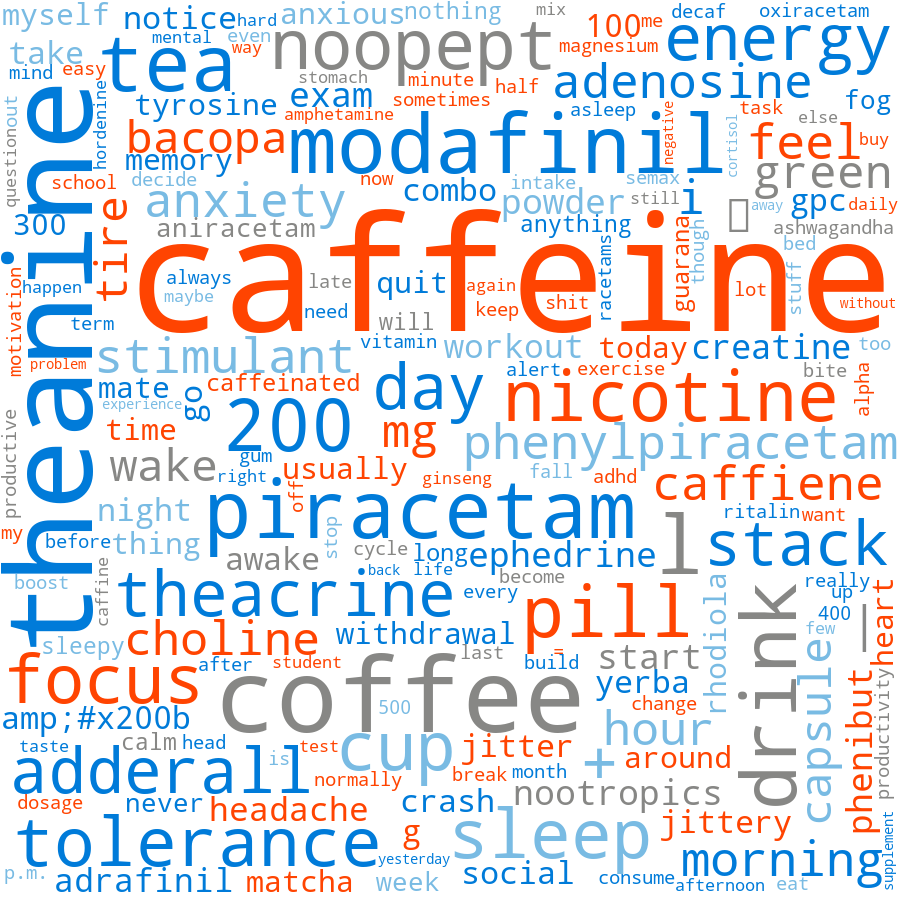

In [26]:
import random

def color_func_reddit(word, **kwargs):
    # Return a random color from reddit's palette.
    colors = ["#ff4401", "#ff4401", "#007bd9", "#007bd9", "#79bbe3", "#878785"]
    return random.choice(colors)

wc = lf.wordcloud_from_node(gcc_reddit, "caffeine", color_func=color_func_reddit)
wc.to_image()

Similarly, we also implemented functions that allow generating wordclouds from either a collection of nodes, or from a link.

Note that the amount of links is enormous, so we can't pre-compute TFs and IDFs - in this case, they are computed on the fly, which takes much longer.
Also note that to speed things up, in this case, the *terms* are the terms that occur in all posts that mention both substances, but the the *documents* used to compute IDFs are the same "documents" as before - that is, there is one document per node (substance), and each documents contains all the terms that appear in all posts about the corresponding substance.

This is not strictly correct - here, there should be one *document* per link between two substances, and each document should thus set of terms that occur in posts that contain both substances in the link. However, using the same documents as above should still give a reasonably good approximation, and is several orders of magnitude faster.

Here is an example of a wordcloud for the links between *Caffeine* and *Theanine*:


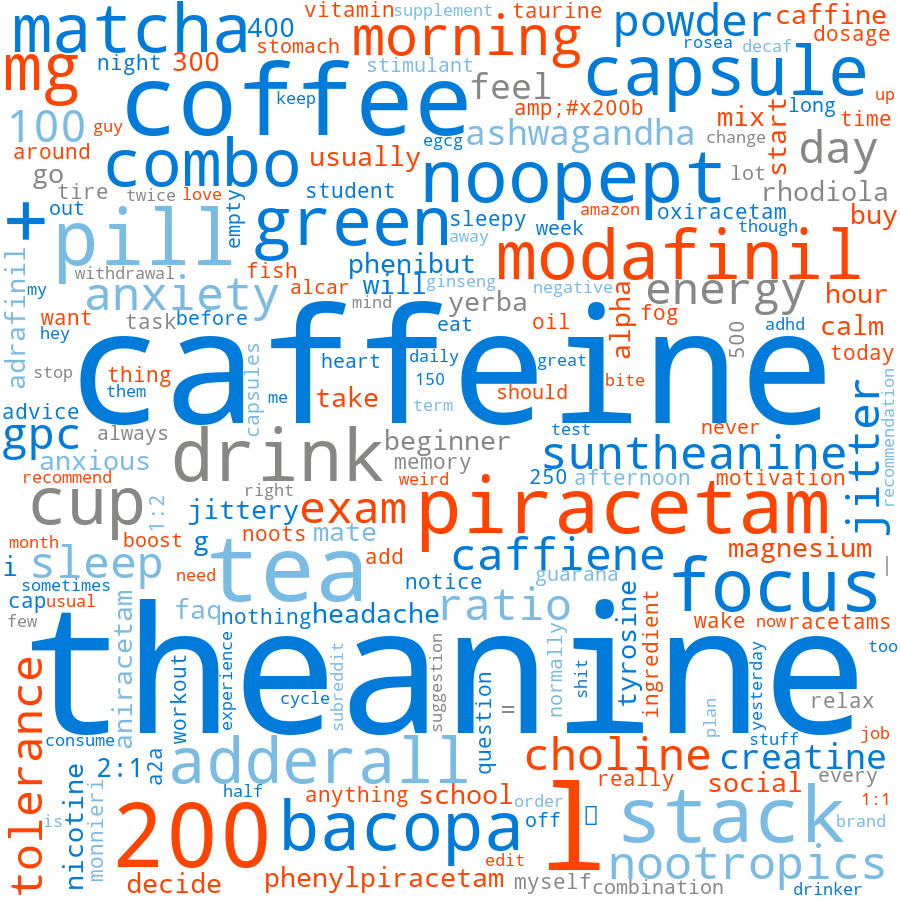

In [27]:
wc = lf.wordcloud_from_link(gcc_reddit, "caffeine", "theanine",
                            color_func=color_func_reddit)
wc.to_image()

The code and idea behind community and link wordclouds is almost identical to the ones based on nodes - so we will not repeat them. For a showcase, playground, and discussion of our results, please see our website [TODO- insert link]

### 3.5.2 Sentiment analysis

The analysis of sentiment of the Reddit content has been performed using the Python package [textblob](https://textblob.readthedocs.io/en/dev). In this package, the positivity of sentiment of a string `text` is represented by the property `polarity` in a range from -1 to 1, corresponding to completely negative to completely positive sentiment. The polarity of text can be easily extracted from the `TextBlob` object as shown in the example below:

In [2]:
# Import the TextBlob object
from textblob import TextBlob

# Create a Text Blob object from string
text = 'Shiny happy people holding hands'
blob = TextBlob(text)

# Print the polarity (positivity of sentiment)
print(f'The polarity of "{text}" is {blob.polarity}.')

The polarity of "Shiny happy people holding hands" is 0.8.


<hr style="border:2px solid black"> </hr>

# 4. Discussion

* What went well?,
* What is still missing? What could be improved?, Why?

<hr style="border:2px solid black"> </hr>

# 5. Contributions

* You should write (just briefly) which group member was the main responsible for which elements of the assignment. (I want you guys to understand every part of the assignment, but usually there is someone who took lead role on certain portions of the work. That’s what you should explain).
